In [1]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from mlxtend.preprocessing import minmax_scaling
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score,adjusted_rand_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder

In [2]:
df = pd.read_csv('finishedd.csv')
df.head()

,title,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,chroma_stft_median_0,chroma_stft_kurtosis_0,chroma_stft_kew_1,chroma_stft_min_1,...,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0,popularity
0,God's Plan,0.287141,0.004479,1.0,0.312579,0.461173,0.403628,-1.328911,0.700293,0.011459,...,0.009058,-0.258379,1.077282,0.003906,0.543945,0.077048,0.099394,0.090332,2.041781,0
1,Perfect,0.504776,0.013271,1.0,0.301525,0.464069,0.406287,-0.854697,1.432437,0.015911,...,0.000184,0.098362,1.992432,0.016602,0.372559,0.056317,0.112154,0.101807,5.541481,0
2,Meant To Be,0.127790,0.010105,1.0,0.323879,0.528688,0.495301,-1.284492,0.828981,0.015159,...,-0.018498,-0.098473,0.175335,0.011230,0.441895,0.064299,0.173092,0.172363,-0.002089,0
3,Havana,0.973138,0.003711,1.0,0.329186,0.356747,0.225295,-0.481076,0.858171,0.003366,...,-0.010677,-0.122050,2.739277,0.012207,0.499023,0.064160,0.077137,0.054199,10.982906,0
4,Rockstar,1.282710,0.023767,1.0,0.244426,0.360199,0.278995,0.773033,0.150423,0.094858,...,-0.007895,-0.510129,5.405704,0.004395,0.529785,0.047993,0.041479,0.032715,42.453803,1


drop na rows

In [3]:
# count the number of rows before dropping NaNs
before_count = len(df)

# drop rows with NaNs
df = df.dropna()

# count the number of rows after dropping NaNs
after_count = len(df)

# print the results
print(f"Number of rows before dropping NaNs: {before_count}")
print(f"Number of rows after dropping NaNs: {after_count}")

Number of rows before dropping NaNs: 480
Number of rows after dropping NaNs: 479


histogram plots are saved on a folder called histogramplots

In [4]:
import matplotlib.pyplot as plt 
import os

# Create 'histogramplots' folder  
os.makedirs('histogramplots', exist_ok=True)

# Loop through each column  
for col in df.columns:

    # Skip title column
    if col == 'title':
        continue
        
    # Generate histogram    
    plt.figure()      
    df[col].hist()
        
    # Add title 
    plt.title(col)
    
    # Save histogram in 'histogramplots' folder       
    plt.savefig(os.path.join('histogramplots', f'hist_{col}.png'))
        
    # Close the plot
    plt.close()

box plots plots are saved on a folder called box_plots

In [6]:
import matplotlib.pyplot as plt
import os

# Make sure the 'box_plots' folder exists     
os.makedirs('box_plots', exist_ok=True)

# Loop through each column name    
for col in df.columns:
    
    # Skip the title column 
    if col == 'title': 
        continue
        
    # Generate a box plot    
    plt.figure()    
    df[col].plot(kind='box')
        
    # Add a title with the column name           
    plt.title(col)
    
    # Save the box plot in 'box_plots' folder        
    plt.savefig(os.path.join('box_plots', f'box_{col}.png'))
    
    # Close the plot      
    plt.close()

<Axes: >

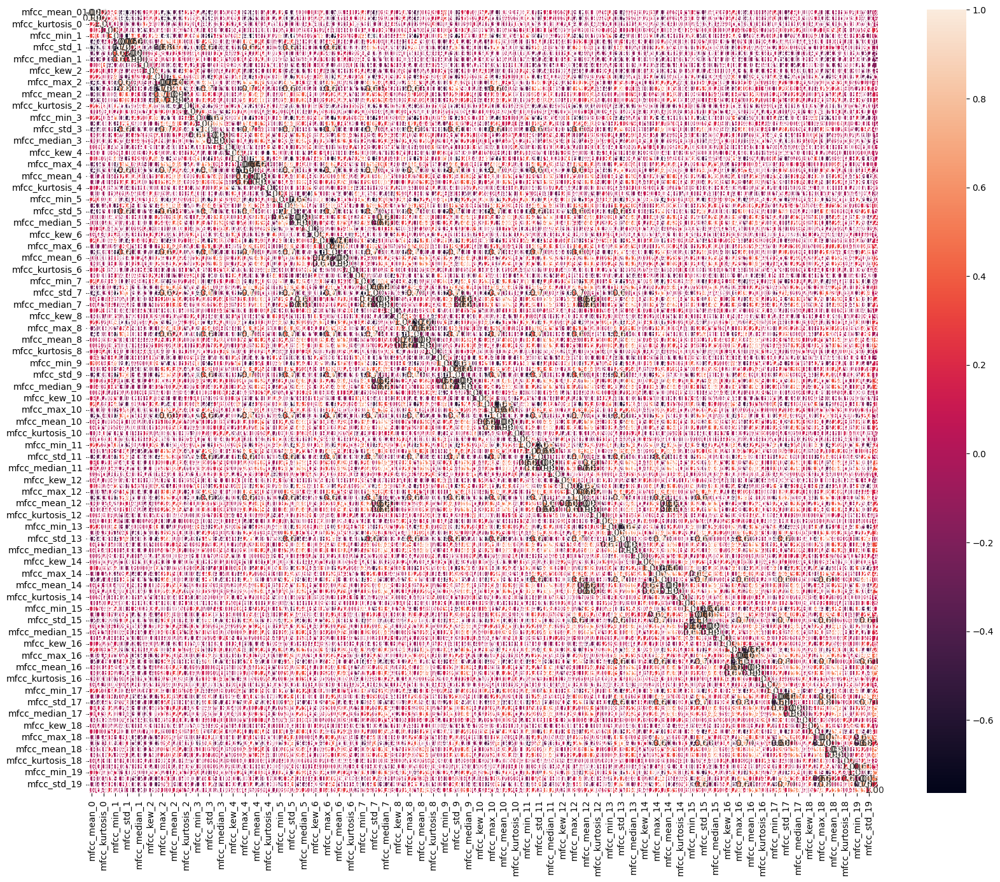

In [9]:
import seaborn as sns

# Select only the MFCC or Chroma features
features = df.loc[:, 'mfcc_mean_0':'mfcc_mean_19']

# Generate a correlation matrix 
corr = features.corr()

# Generate a heatmap 
fig, ax = plt.subplots(figsize=(20,16))
sns.heatmap(corr, annot=True, linewidths=0.5, fmt= '.2f', ax=ax)

In [4]:
dff = df.drop(columns=["title"],axis=1)

In [21]:
mean = dff.mean()
std = dff.std()  
min = dff.min()  
max = dff.max()
q1 = dff.quantile(0.25)  
q3 = dff.quantile(0.75)
median = dff.median()

stats = pd.DataFrame({
    'mean': mean,   
    'std': std,
    'min': min,
    '25%': q1,  
    '50%': median,       
    '75%': q3,    
    'max': max
})

stats = stats.T 
stats.columns = dff.columns

In [22]:
stats

,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,chroma_stft_median_0,chroma_stft_kurtosis_0,chroma_stft_kew_1,chroma_stft_min_1,chroma_stft_max_1,...,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0,popularity
mean,0.684314,0.017810,1.0,0.282233,0.417296,0.356876,-0.162217,0.693126,0.016402,0.999641,...,0.000002,0.476494,1.872283,0.014498,0.391093,0.055873,0.091957,0.080130,6.780613,0.185804
std,0.580833,0.021633,0.0,0.047362,0.122145,0.152470,1.533499,0.543672,0.018878,0.004665,...,0.024312,1.350336,1.114299,0.013266,0.149848,0.022221,0.032826,0.033454,8.130908,0.389355
min,-1.062659,0.000134,1.0,0.147864,0.110807,0.044984,-1.689473,-1.035164,0.000092,0.915062,...,-0.073418,-1.488221,-0.454961,0.001953,0.063477,0.007969,0.009071,0.007080,-1.016685,0.000000
25%,0.280541,0.004772,1.0,0.253766,0.326183,0.246165,-1.177221,0.349961,0.004490,1.000000,...,-0.013653,-0.275773,1.137055,0.004639,0.273438,0.040102,0.069970,0.056885,1.670180,0.000000
50%,0.706183,0.010663,1.0,0.283297,0.403965,0.337314,-0.545459,0.674647,0.010531,1.000000,...,-0.002275,0.178560,1.712153,0.009766,0.375488,0.051769,0.089846,0.080322,4.193266,0.000000
75%,1.053152,0.020564,1.0,0.318420,0.502755,0.450187,0.312465,1.036055,0.021178,1.000000,...,0.011552,0.859834,2.424676,0.020508,0.507324,0.066974,0.113475,0.101196,9.045866,0.000000
max,3.223541,0.183540,1.0,0.385334,0.821813,1.000000,12.783839,3.068296,0.156431,1.000000,...,0.091564,16.568589,6.863791,0.097656,0.742676,0.146671,0.214794,0.190918,61.523964,1.000000


<Axes: >

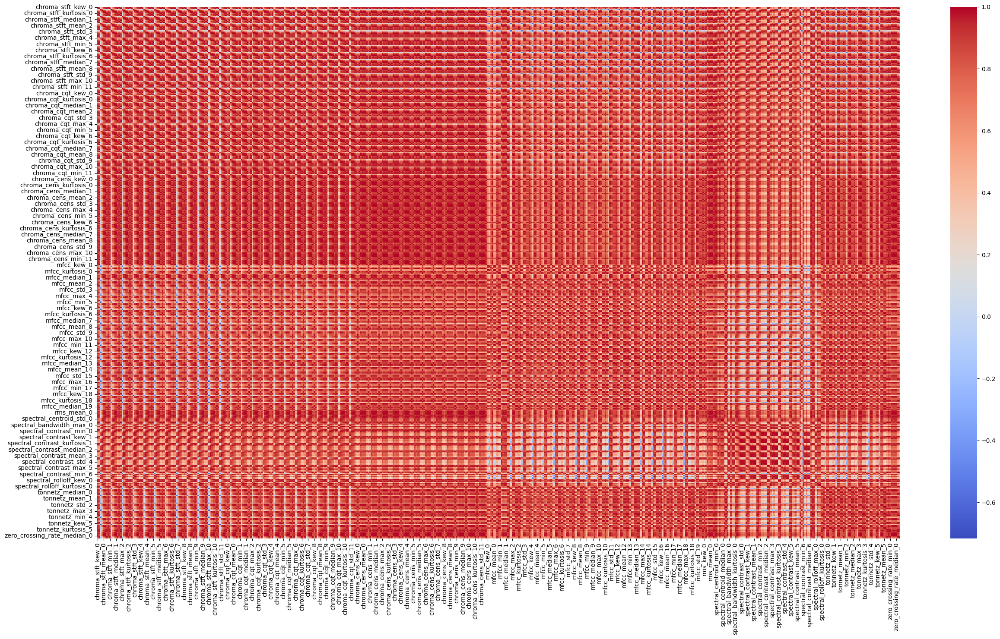

In [25]:
correlation_matrix = stats.corr()
fig, ax = plt.subplots(figsize=(30,16))
sns.heatmap(correlation_matrix,  cmap='coolwarm')

kde plots are saved on a folder called kde

In [ ]:
import matplotlib.pyplot as plt 
import seaborn as sns
import os

# Create 'kde' folder
os.makedirs('kde', exist_ok=True)

# Loop through each column  
for col in df.columns:
    
    # Skip non-audio features     
    if col == 'title':
        continue
        
    # Generate KDE plot    
    sns.displot(df[col], kind="kde")
        
    # Add title      
    plt.title(col)
    
    # Save KDE plot in 'kde' folder    
    plt.savefig(os.path.join('kde', f'kde_{col}.png'))
     
    # Close plot      
    plt.close()

violin plots are saved on a folder called  violin_plots

In [9]:
import seaborn as sns
import os

# Create 'violin_plots' folder
os.makedirs('violin_plots', exist_ok=True)

for col in df.columns:
    
    # Skip non-feature columns
    if col == 'title':
        continue
        
    # Generate violin plot    
    sns.violinplot(x=col, data=df)
        
    # Add title    
    plt.title(col)
        
    # Save figure       
    plt.savefig(os.path.join('violin_plots', f'{col}_violin.png'))
        
    # Close plot       
    plt.close()

In [11]:
dffff = pd.read_csv('finished.csv')
dffff.head()

,chorus_path,title,artist,rank,year,popularity,file_path,chroma_mean_1,chroma_mean_2,chroma_mean_3,...,spectral_bandwidth,spectral_rolloff,tonal_centroid_1,tonal_centroid_2,tonal_centroid_3,tonal_centroid_4,tonal_centroid_5,tonal_centroid_6,zero_crossing_rate,tuning
0,choruss\God's Plan_chorus.wav,God's Plan,Drake,1,2018,Not Popular,C:\Users\lenovo\Documents\gitt\major project t...,0.461173,0.381145,0.403710,...,2682.992850,5911.714253,0.017783,0.073244,-0.007265,0.043298,0.030742,0.011384,0.099394,0.43
1,choruss\Perfect_chorus.wav,Perfect,Ed Sheeran,2,2018,Not Popular,C:\Users\lenovo\Documents\gitt\major project t...,0.464069,0.309378,0.299474,...,2666.307088,5632.582607,-0.198288,0.033524,0.010659,0.125335,-0.027464,0.006620,0.112154,0.04
2,choruss\Meant To Be_chorus.wav,Meant To Be,Bebe Rexha & Florida Georgia Line,3,2018,Not Popular,C:\Users\lenovo\Documents\gitt\major project t...,0.528688,0.374284,0.522552,...,2604.404279,5942.630732,-0.030114,0.133833,-0.020918,-0.066136,-0.005360,-0.021581,0.173092,-0.01
3,choruss\Havana_chorus.wav,Havana,Camila Cabello Featuring Young Thug,4,2018,Not Popular,C:\Users\lenovo\Documents\gitt\major project t...,0.356747,0.351416,0.552725,...,2405.533607,4315.707237,0.117722,0.130964,0.048116,-0.178512,-0.010232,-0.002494,0.077137,0.01
4,choruss\Rockstar_chorus.wav,Rockstar,Post Malone Featuring 21 Savage,5,2018,Not Popular,C:\Users\lenovo\Documents\gitt\major project t...,0.360199,0.540816,0.705766,...,2205.735504,3590.844953,-0.012893,0.079543,0.166280,0.004810,0.055512,0.001323,0.041479,-0.03


waveform plots are saved in a folder called waveforms

In [25]:
import matplotlib.pyplot as plt  
import librosa
import os

# Filter out rows with missing chorus_path values
dffff = dffff.dropna(subset=['chorus_path'])

# Create 'waveforms' folder
os.makedirs('waveforms', exist_ok=True)

# Loop through each chorus_path  
for i in range(len(dffff.chorus_path)):
    
    audio_path = "C:/Users/lenovo/Documents/gitt/major project technolabs 1/Building-a-Model-to-Predict-Hit-Songs-Using-Repeated-Chorus/" + str(dffff.chorus_path.iloc[i])

    # Load the audio signal
    signal, sr = librosa.load(audio_path)
    
    # Plot the waveform    
    plt.figure(figsize=(12,4))  
    plt.plot(signal)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
        
    # Add title     
    plt.title(dffff.title.iloc[i])  
    
    # Save figure to chorus_path with song title in filename
    filename = dffff.title.iloc[i] + '_waveform.png'
    plt.savefig(os.path.join('waveforms', filename))
        
    # Close plot   
    plt.close()

In [32]:
y = df.popularity
X = df.drop(columns=["popularity","title"],axis=1)

In [34]:
X.head()

,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,chroma_stft_median_0,chroma_stft_kurtosis_0,chroma_stft_kew_1,chroma_stft_min_1,chroma_stft_max_1,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
0,0.287141,0.004479,1.0,0.312579,0.461173,0.403628,-1.328911,0.700293,0.011459,1.0,...,0.011384,0.009058,-0.258379,1.077282,0.003906,0.543945,0.077048,0.099394,0.090332,2.041781
1,0.504776,0.013271,1.0,0.301525,0.464069,0.406287,-0.854697,1.432437,0.015911,1.0,...,0.006620,0.000184,0.098362,1.992432,0.016602,0.372559,0.056317,0.112154,0.101807,5.541481
2,0.127790,0.010105,1.0,0.323879,0.528688,0.495301,-1.284492,0.828981,0.015159,1.0,...,-0.021581,-0.018498,-0.098473,0.175335,0.011230,0.441895,0.064299,0.173092,0.172363,-0.002089
3,0.973138,0.003711,1.0,0.329186,0.356747,0.225295,-0.481076,0.858171,0.003366,1.0,...,-0.002494,-0.010677,-0.122050,2.739277,0.012207,0.499023,0.064160,0.077137,0.054199,10.982906
4,1.282710,0.023767,1.0,0.244426,0.360199,0.278995,0.773033,0.150423,0.094858,1.0,...,0.001323,-0.007895,-0.510129,5.405704,0.004395,0.529785,0.047993,0.041479,0.032715,42.453803


In [33]:
from sklearn.model_selection import train_test_split
train_X, val_X, train_y, val_y = train_test_split(X, y, random_state = 1)

In [34]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

model2 = RandomForestRegressor(random_state=1)
model2.fit(train_X, train_y)

RandomForestRegressor(random_state=1)

In [11]:
predictions = model2.predict(val_X)
print("Mean Absolute Error: " + str(mean_absolute_error(predictions, val_y)))

Mean Absolute Error: 0.24233333333333332


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model2, random_state=1).fit(val_X, val_y)
eli5.show_weights(perm, feature_names = val_X.columns.tolist())

i have an error in libraries here but i have done this on google colab and here is output

In [ ]:

Weight	Feature
0.0194 ± 0.0089	chroma_cens_kurtosis_7
0.0160 ± 0.0295	chroma_cens_std_9
0.0155 ± 0.0068	mfcc_kurtosis_3
0.0154 ± 0.0183	mfcc_min_9
0.0147 ± 0.0060	mfcc_std_19
0.0137 ± 0.0043	spectral_contrast_kew_1
0.0111 ± 0.0045	chroma_stft_kurtosis_0
0.0110 ± 0.0026	chroma_cqt_kurtosis_7
0.0101 ± 0.0013	spectral_contrast_min_2
0.0098 ± 0.0041	chroma_cens_kew_1
0.0098 ± 0.0044	tonnetz_max_1
0.0096 ± 0.0112	chroma_cqt_median_10
0.0094 ± 0.0042	mfcc_median_16
0.0091 ± 0.0092	chroma_stft_std_0
0.0090 ± 0.0122	mfcc_kew_7
0.0065 ± 0.0024	spectral_centroid_min_0
0.0064 ± 0.0032	tonnetz_kurtosis_5
0.0062 ± 0.0069	spectral_contrast_kurtosis_1
0.0061 ± 0.0032	chroma_cens_median_1
0.0059 ± 0.0020	mfcc_min_5
… 498 more …


lets try with the top 20 feutures only and see mer 

In [12]:
feutures_2 = ['chroma_cens_kurtosis_7',
'chroma_cens_std_9',
'mfcc_kurtosis_3',
'mfcc_min_9',
'mfcc_std_19',
'spectral_contrast_kew_1',
'chroma_stft_kurtosis_0',
'chroma_cqt_kurtosis_7',
'spectral_contrast_min_2',
'chroma_cens_kew_1',
'tonnetz_max_1',
'chroma_cqt_median_10',
'mfcc_median_16',
'chroma_stft_std_0',
'mfcc_kew_7',
'spectral_centroid_min_0',
'tonnetz_kurtosis_5',
'spectral_contrast_kurtosis_1',
'chroma_cens_median_1',
'mfcc_min_5']
train_X2= train_X[feutures_2]
train_X2

,chroma_cens_kurtosis_7,chroma_cens_std_9,mfcc_kurtosis_3,mfcc_min_9,mfcc_std_19,spectral_contrast_kew_1,chroma_stft_kurtosis_0,chroma_cqt_kurtosis_7,spectral_contrast_min_2,chroma_cens_kew_1,tonnetz_max_1,chroma_cqt_median_10,mfcc_median_16,chroma_stft_std_0,mfcc_kew_7,spectral_centroid_min_0,tonnetz_kurtosis_5,spectral_contrast_kurtosis_1,chroma_cens_median_1,mfcc_min_5
94,-0.829966,0.087943,1.108305,-19.326946,9.515009,-0.168116,-1.484081,-1.353334,5.046251,0.775783,0.132949,0.251047,4.521124,0.323667,-0.983414,1458.429934,-0.694812,0.452743,0.052917,-48.464817
86,1.403253,0.136399,0.339962,-33.751022,10.415342,0.445457,0.266911,-0.322933,6.674597,-0.046500,0.088681,0.335363,0.835627,0.238889,-0.761287,462.956665,-0.625228,0.396784,0.255480,-45.811333
376,1.568707,0.090743,0.712928,-21.930285,5.399407,0.419586,-0.247150,-0.933394,7.822601,0.394419,0.270999,0.459366,-3.948209,0.290980,-0.595700,961.739861,0.546453,0.157377,0.248878,-31.030030
82,-1.228459,0.068258,-0.543556,-8.909990,6.092690,0.492753,1.960250,-1.408023,8.219708,-0.329724,0.262045,0.323523,-6.478937,0.241951,-0.270441,1078.495894,-0.013996,0.664603,0.234005,-16.021114
42,-0.051013,0.156627,-0.617718,-41.762383,7.257190,0.286467,-0.336108,-0.410620,6.524046,0.390941,0.427281,0.391883,-2.664512,0.265973,-0.268843,237.011284,-0.440495,-0.040072,0.241697,-41.993530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256,1.506406,0.084037,-0.202900,-47.543800,8.372280,-0.068629,-1.420079,0.604203,7.277862,0.391115,0.530963,0.189880,-14.851873,0.344555,0.280768,356.629157,-0.065321,-0.278718,0.215695,-36.117123
73,1.482669,0.065603,-0.062615,-10.913877,6.743349,0.332477,-0.978156,-0.895252,4.486823,0.279466,0.270040,0.483051,-1.701202,0.272454,0.314031,790.817655,1.510668,0.771924,0.390970,-14.358801
397,0.081621,0.159433,0.550711,-41.413330,7.907177,0.351452,-0.516367,-1.234042,5.732707,0.662312,0.135599,0.392419,-2.582262,0.297839,-1.011026,632.231402,0.434033,0.575907,0.246956,-54.822937
236,-1.464810,0.059017,-0.565068,-58.552605,6.728508,0.298957,-1.487465,-1.592961,6.531712,0.196948,0.362006,0.490272,-0.920733,0.348687,-0.597139,158.016442,0.604956,-0.099080,0.236671,-41.425453


In [13]:
val_X2 = val_X[feutures_2]


In [14]:
forest_model = RandomForestRegressor(random_state=1)
forest_model.fit(train_X2, train_y)
melb_preds = forest_model.predict(val_X2)
print(mean_absolute_error(val_y, melb_preds))

0.21433333333333332


okay the error is less and it is quite more accurate

C:\Users\lenovo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


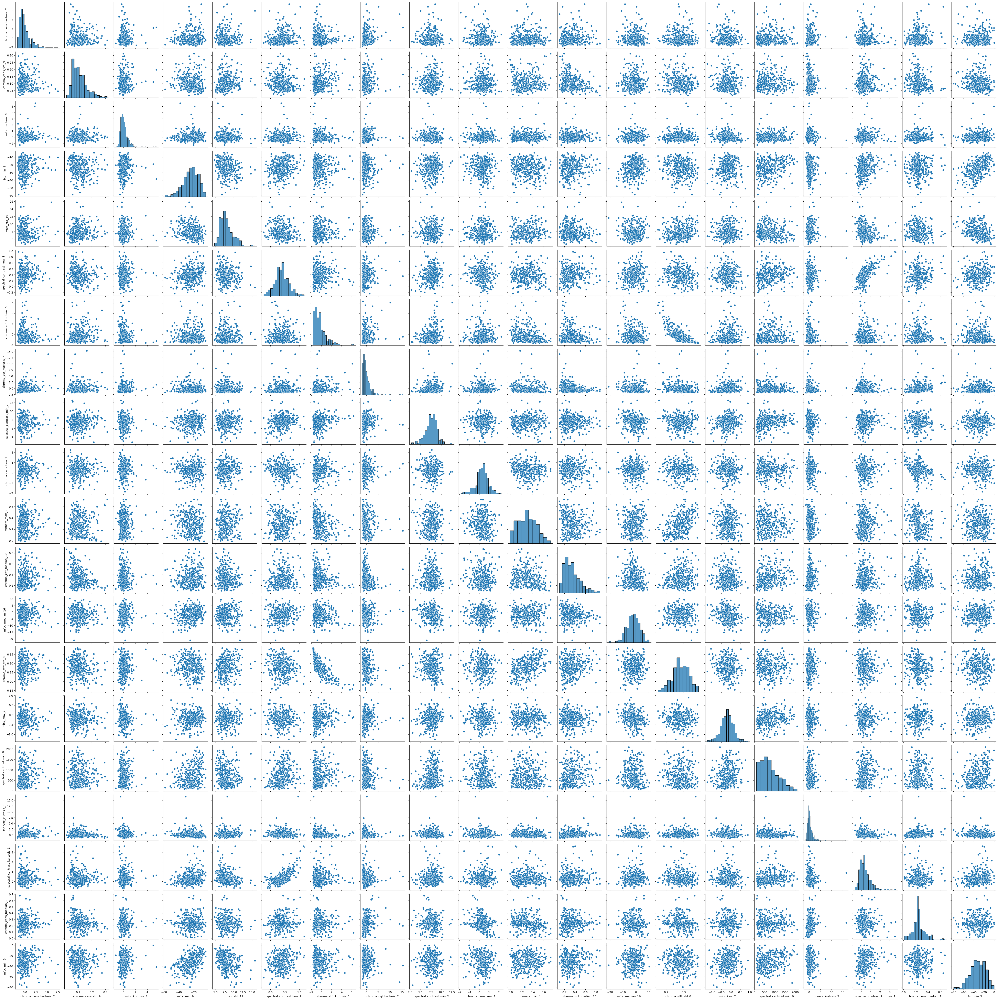

In [54]:
sns.pairplot(train_X2)


In [58]:
correlation_matrix = train_X2.corr()

<Axes: >

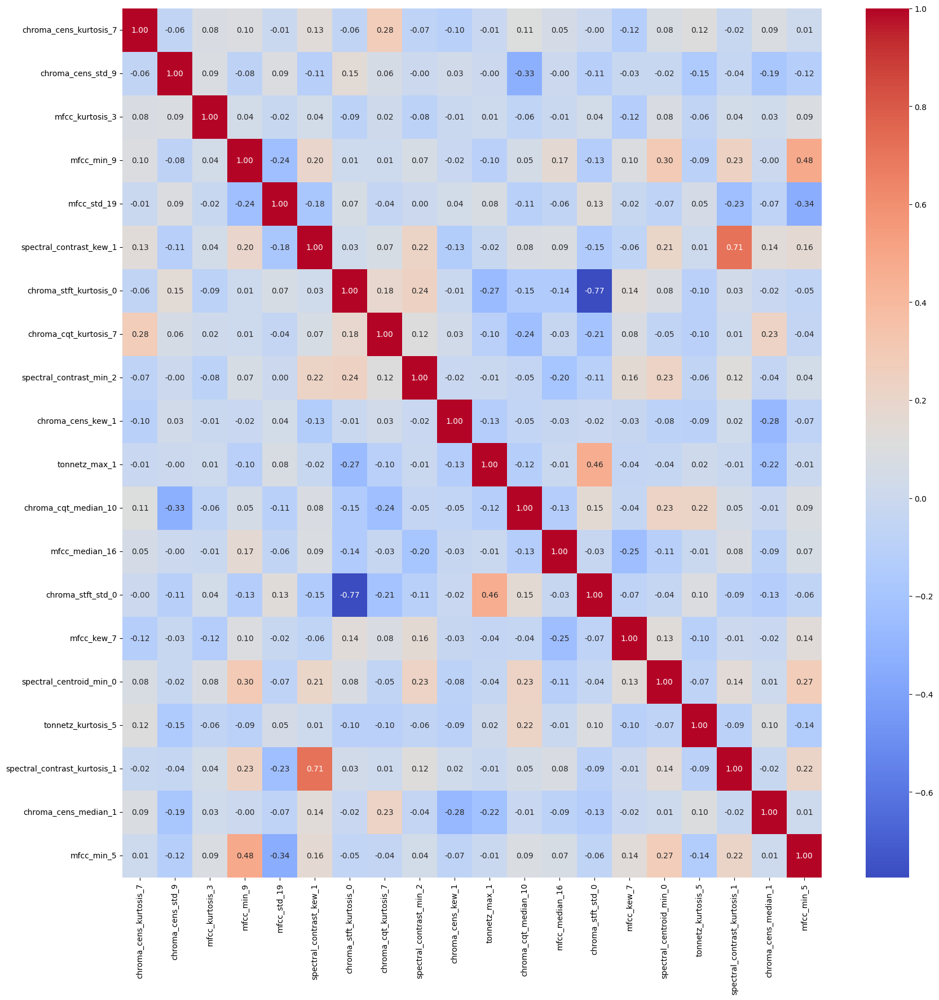

In [59]:
plt.figure(figsize=(20,20))
sns.heatmap(correlation_matrix, annot = True, cmap='coolwarm', fmt=".2f")

In [15]:
mean = train_X2.mean()
std = train_X2.std()  
min = train_X2.min()  
max = train_X2.max()
q1 = train_X2.quantile(0.25)  
q3 = train_X2.quantile(0.75)
median = train_X2.median()

stats = pd.DataFrame({
    'mean': mean,   
    'std': std,
    'min': min,
    '25%': q1,  
    '50%': median,       
    '75%': q3,    
    'max': max
})

stats = stats.T 
stats.columns = feutures_2

<Axes: >

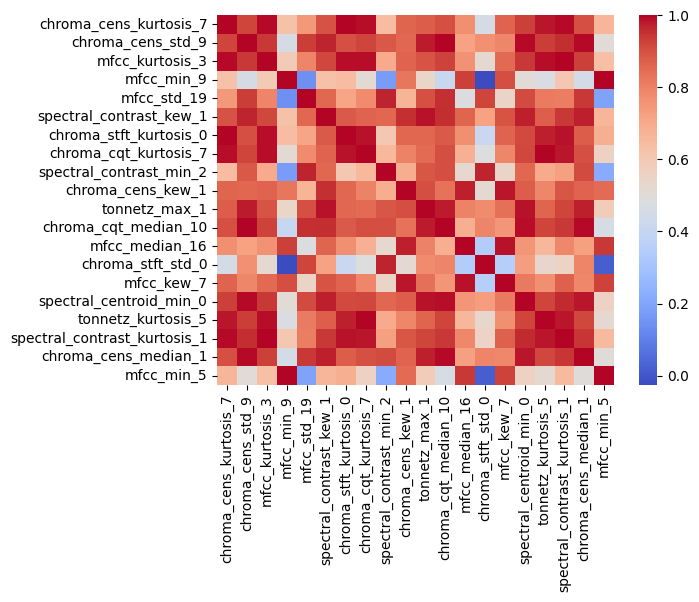

In [20]:
correlation_matrix = stats.corr()
sns.heatmap(correlation_matrix, cmap='coolwarm')

heat map helps visualizing statistics the feutures with similar statistics and different statistics

Random Forest Feature importance

In [35]:
importances=model2.feature_importances_
feature_names=train_X.columns
std = np.std([model2.feature_importances_ for model in forest_model.estimators_], axis=0)

Text(24.0, 0.5, 'Mean decrease in impurity')

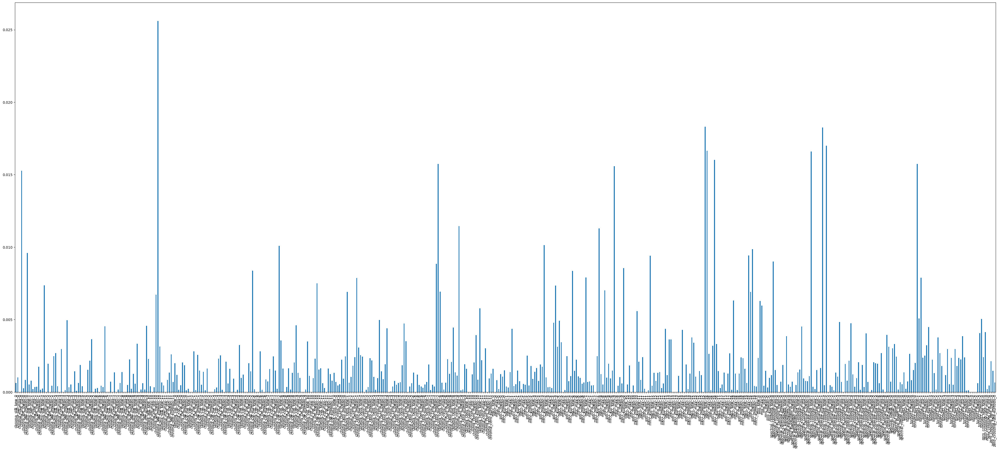

In [40]:
forest_importances = pd.Series(importances, index=feature_names)
plt.figure(figsize=(50,20))
# fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")


In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Train random forest model and calculate feature importances
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier

# Create list of features with importance above 0.015
threshold = 0.015
important_features = list(forest_importances.where(forest_importances >= threshold).dropna().index)

print(f"Features with importance above {threshold}: {important_features}")

Features with importance above 0.015: ['chroma_stft_std_0', 'chroma_stft_median_10', 'chroma_cens_kurtosis_7', 'mfcc_min_9', 'mfcc_kew_16', 'mfcc_min_16', 'mfcc_median_16', 'spectral_contrast_kew_1', 'spectral_contrast_kurtosis_1', 'spectral_contrast_min_2', 'tonnetz_kew_1']


from feuture importance ['chroma_stft_std_0', 'chroma_stft_median_10', 'chroma_cens_kurtosis_7', 'mfcc_min_9', 'mfcc_kew_16', 'mfcc_min_16', 'mfcc_median_16', 'spectral_contrast_kew_1', 'spectral_contrast_kurtosis_1', 'spectral_contrast_min_2', 'tonnetz_kew_1']
from permutation: ['chroma_cens_kurtosis_7',
'chroma_cens_std_9',
'mfcc_kurtosis_3',
'mfcc_min_9',
'mfcc_std_19',
'spectral_contrast_kew_1',
'chroma_stft_kurtosis_0',
'chroma_cqt_kurtosis_7',
'spectral_contrast_min_2',
'chroma_cens_kew_1',
'tonnetz_max_1',
'chroma_cqt_median_10',
'mfcc_median_16',
'chroma_stft_std_0',
'mfcc_kew_7',
'spectral_centroid_min_0',
'tonnetz_kurtosis_5',
'spectral_contrast_kurtosis_1',
'chroma_cens_median_1',
'mfcc_min_5']

they are not exact lets try them as feutures and see mer

In [47]:
feutures_3 = ['chroma_stft_std_0', 
'chroma_stft_median_10', 
'chroma_cens_kurtosis_7', 
'mfcc_min_9', 
'mfcc_kew_16', 
'mfcc_min_16', 
'mfcc_median_16', 
'spectral_contrast_kew_1', 
'spectral_contrast_kurtosis_1', 
'spectral_contrast_min_2', 
'tonnetz_kew_1']
train_X3= train_X[feutures_3]
train_X3

,chroma_stft_std_0,chroma_stft_median_10,chroma_cens_kurtosis_7,mfcc_min_9,mfcc_kew_16,mfcc_min_16,mfcc_median_16,spectral_contrast_kew_1,spectral_contrast_kurtosis_1,spectral_contrast_min_2,tonnetz_kew_1
94,0.323667,0.488325,-0.829966,-19.326946,-0.375791,-22.884008,4.521124,-0.168116,0.452743,5.046251,-0.428885
86,0.238889,0.263087,1.403253,-33.751022,-0.086511,-24.550898,0.835627,0.445457,0.396784,6.674597,-0.954890
376,0.290980,0.309067,1.568707,-21.930285,0.183020,-27.233318,-3.948209,0.419586,0.157377,7.822601,0.502981
82,0.241951,0.247852,-1.228459,-8.909990,-0.064675,-24.484787,-6.478937,0.492753,0.664603,8.219708,-0.248811
42,0.265973,0.626106,-0.051013,-41.762383,-0.113633,-31.379593,-2.664512,0.286467,-0.040072,6.524046,1.766596
...,...,...,...,...,...,...,...,...,...,...,...
256,0.344555,0.153409,1.506406,-47.543800,0.125900,-38.629204,-14.851873,-0.068629,-0.278718,7.277862,0.415969
73,0.272454,0.523600,1.482669,-10.913877,0.098202,-22.123020,-1.701202,0.332477,0.771924,4.486823,0.349541
397,0.297839,0.238704,0.081621,-41.413330,0.190929,-22.871788,-2.582262,0.351452,0.575907,5.732707,-0.844088
236,0.348687,0.457010,-1.464810,-58.552605,0.222320,-18.509407,-0.920733,0.298957,-0.099080,6.531712,0.004691


In [48]:
val_X3 = val_X[feutures_3]
val_X3


,chroma_stft_std_0,chroma_stft_median_10,chroma_cens_kurtosis_7,mfcc_min_9,mfcc_kew_16,mfcc_min_16,mfcc_median_16,spectral_contrast_kew_1,spectral_contrast_kurtosis_1,spectral_contrast_min_2,tonnetz_kew_1
294,0.341250,0.178839,0.019877,-20.748022,0.401027,-25.273624,-4.544535,0.544767,0.388438,7.757590,0.394687
284,0.227291,0.162523,-0.508288,-27.483652,-0.086840,-35.199062,-8.418850,0.353204,0.563345,6.863524,-1.564536
35,0.324305,0.433373,-1.135796,-26.686016,-0.131358,-32.262550,-8.501949,0.361988,0.287117,7.778555,0.305173
381,0.257339,0.410486,0.045681,-13.727549,0.300799,-18.381600,-2.950973,0.308114,0.125788,6.696424,-0.326285
431,0.291938,0.537246,-1.166164,-47.605843,0.007216,-31.657076,-2.990683,0.689379,0.051954,4.433484,-0.253707
...,...,...,...,...,...,...,...,...,...,...,...
354,0.333492,0.434033,-0.247335,-32.733418,0.296253,-28.289010,-6.038686,0.445277,0.298513,8.189976,-0.398162
81,0.312815,0.642618,-0.727310,-28.749820,-0.043478,-11.715521,8.287611,0.634725,0.640540,9.371392,-0.482431
47,0.280363,0.625225,-1.208506,-33.004360,-0.666088,-34.746690,-1.261257,0.242903,-0.191706,5.082691,-1.554807
136,0.348878,0.227766,0.679603,-18.648136,0.166417,-24.166292,-2.915916,0.459970,0.318952,8.218710,0.370779


In [51]:
forest_model3 = RandomForestRegressor(random_state=1)
forest_model3.fit(train_X3, train_y)
melb_preds3 = forest_model3.predict(val_X3)
print(mean_absolute_error(val_y, melb_preds3)) 

0.252


the error increased so model 2 was the best

In [13]:
df.isnull().sum()


title                            0
chroma_stft_kew_0                0
chroma_stft_min_0                0
chroma_stft_max_0                0
chroma_stft_std_0                0
                                ..
zero_crossing_rate_std_0         0
zero_crossing_rate_mean_0        0
zero_crossing_rate_median_0      0
zero_crossing_rate_kurtosis_0    0
popularity                       0
Length: 520, dtype: int64

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 479 entries, 0 to 479
Columns: 520 entries, title to popularity
dtypes: float64(518), int64(1), object(1)
memory usage: 1.9+ MB


<Axes: >

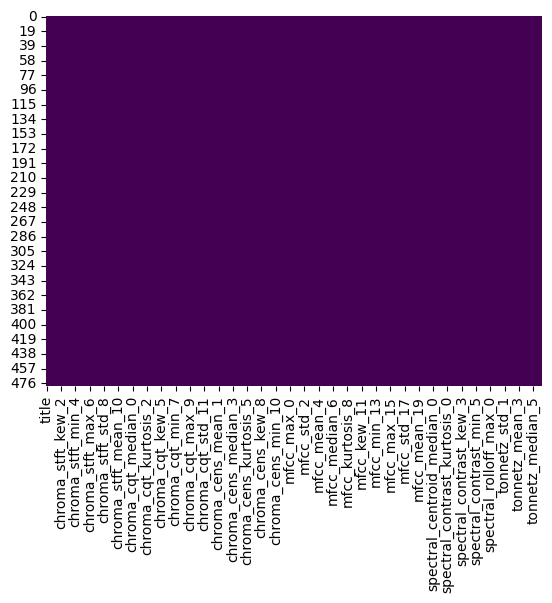

In [15]:
sns.heatmap(df.isnull(),cbar=False,cmap='viridis')

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),cbar=True,annot=True,cmap='Blues')

<ipython-input-16-5e2cb1188e72>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),cbar=True,annot=True,cmap='Blues')


<Axes: >